# Importing libraries
 

In [1]:
from sklearn import tree
from sklearn import svm
from sklearn import ensemble
from sklearn import neighbors
from sklearn import linear_model
from sklearn import metrics
from sklearn import preprocessing
from sklearn.model_selection import train_test_split


In [2]:
%matplotlib inline 

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
# Input data files are available in the "../input/" directory.
import os
import matplotlib.pyplot as plt#visualization
from PIL import  Image
%matplotlib inline
import pandas as pd
import seaborn as sns#visualization
import itertools
import warnings
warnings.filterwarnings("ignore")
import io
import plotly.offline as py#visualization
py.init_notebook_mode(connected=True)#visualization
import plotly.graph_objs as go#visualization
import plotly.tools as tls#visualization
import plotly.figure_factory as ff#visualization

In [3]:
from mlxtend.plotting import plot_confusion_matrix



In [4]:
telcom = pd.read_csv('Telco-Customer-Churn.csv')

telcom.head(5)


,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,...,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,...,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


In [5]:
telcom.shape

(7043, 21)

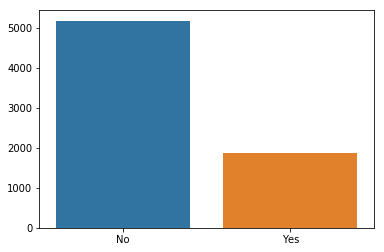

In [5]:
y = telcom["Churn"].value_counts()
sns.barplot(y.index, y.values)

In [11]:
y_Yes = telcom["Churn"][telcom["Churn"] == "Yes"]
print ("Customers who left within the last month Percentage = "+str( (y_Yes.shape[0] / telcom["Churn"].shape[0]) * 100 ))

Customers who left within the last month Percentage = 26.536987079369588


In [7]:
print ("Rows     : " ,telcom.shape[0])
print ("Columns  : " ,telcom.shape[1])
print ("\nFeatures : \n" ,telcom.columns.tolist())
print ("\nMissing values :  ", telcom.isnull().sum().values.sum())
print ("\nUnique values :  \n",telcom.nunique())

Rows     :  7043
Columns  :  21

Features : 
 ['customerID', 'gender', 'SeniorCitizen', 'Partner', 'Dependents', 'tenure', 'PhoneService', 'MultipleLines', 'InternetService', 'OnlineSecurity', 'OnlineBackup', 'DeviceProtection', 'TechSupport', 'StreamingTV', 'StreamingMovies', 'Contract', 'PaperlessBilling', 'PaymentMethod', 'MonthlyCharges', 'TotalCharges', 'Churn']

Missing values :   0

Unique values :  
 customerID          7043
gender                 2
SeniorCitizen          2
Partner                2
Dependents             2
tenure                73
PhoneService           2
MultipleLines          3
InternetService        3
OnlineSecurity         3
OnlineBackup           3
DeviceProtection       3
TechSupport            3
StreamingTV            3
StreamingMovies        3
Contract               3
PaperlessBilling       2
PaymentMethod          4
MonthlyCharges      1585
TotalCharges        6531
Churn                  2
dtype: int64


In [8]:
telcom['TotalCharges'][telcom['TotalCharges']==" "]

488      
753      
936      
1082     
1340     
3331     
3826     
4380     
5218     
6670     
6754     
Name: TotalCharges, dtype: object

# Data Manipulation

In [11]:
#Replacing spaces with null values in total charges column
telcom['TotalCharges'] = telcom["TotalCharges"].replace(" ",np.nan)

In [12]:
#Dropping null values from total charges column which contain .15% missing data 
telcom = telcom[telcom["TotalCharges"].notnull()]
telcom = telcom.reset_index()[telcom.columns]

In [13]:
#convert to float type
telcom["TotalCharges"] = telcom["TotalCharges"].astype(float)

In [14]:
#replace 'No internet service' to No for the following columns
replace_cols = [ 'OnlineSecurity', 'OnlineBackup', 'DeviceProtection',
                'TechSupport','StreamingTV', 'StreamingMovies']
for i in replace_cols : 
    telcom[i]  = telcom[i].replace({'No internet service' : 'No'})

In [15]:
#replace values
telcom["SeniorCitizen"] = telcom["SeniorCitizen"].replace({1:"Yes",0:"No"})

In [16]:
#Tenure to categorical column
def tenure_lab(telcom) :
    
    if telcom["tenure"] <= 12 :
        return "Tenure_0-12"
    elif (telcom["tenure"] > 12) & (telcom["tenure"] <= 24 ):
        return "Tenure_12-24"
    elif (telcom["tenure"] > 24) & (telcom["tenure"] <= 48) :
        return "Tenure_24-48"
    elif (telcom["tenure"] > 48) & (telcom["tenure"] <= 60) :
        return "Tenure_48-60"
    elif telcom["tenure"] > 60 :
        return "Tenure_gt_60"
telcom["tenure_group"] = telcom.apply(lambda telcom:tenure_lab(telcom),
                                      axis = 1)

In [17]:
#Separating churn and non churn customers
churn     = telcom[telcom["Churn"] == "Yes"]
not_churn = telcom[telcom["Churn"] == "No"]

In [18]:
#Separating catagorical and numerical columns
Id_col     = ['customerID']
target_col = ["Churn"]
cat_cols   = telcom.nunique()[telcom.nunique() < 6].keys().tolist()
cat_cols   = [x for x in cat_cols if x not in target_col]
num_cols   = [x for x in telcom.columns if x not in cat_cols + target_col + Id_col]

# Exploratory Data Analysis

Customer attrition in data

In [19]:
#labels
lab = telcom["Churn"].value_counts().keys().tolist()
#values
val = telcom["Churn"].value_counts().values.tolist()

trace = go.Pie(labels = lab ,
               values = val ,
               marker = dict(colors =  [ 'royalblue' ,'lime'],
                             line = dict(color = "white",
                                         width =  1.3)
                            ),
               rotation = 90,
               hoverinfo = "label+value+text",
               hole = .5
              )
layout = go.Layout(dict(title = "Customer attrition in data",
                        plot_bgcolor  = "rgb(243,243,243)",
                        paper_bgcolor = "rgb(243,243,243)",
                       )
                  )

data = [trace]
fig = go.Figure(data = data,layout = layout)
py.iplot(fig)

# Variables distribution in customer attrition

<h3>Function  for pie plot for customer attrition types</h3>


In [20]:
def plot_pie(column) :
    
    trace1 = go.Pie(values  = churn[column].value_counts().values.tolist(),
                    labels  = churn[column].value_counts().keys().tolist(),
                    hoverinfo = "label+percent+name",
                    domain  = dict(x = [0,.48]),
                    name    = "Churn Customers",
                    marker  = dict(line = dict(width = 2,
                                               color = "rgb(243,243,243)")
                                  ),
                    hole    = .6
                   )
    trace2 = go.Pie(values  = not_churn[column].value_counts().values.tolist(),
                    labels  = not_churn[column].value_counts().keys().tolist(),
                    hoverinfo = "label+percent+name",
                    marker  = dict(line = dict(width = 2,
                                               color = "rgb(243,243,243)")
                                  ),
                    domain  = dict(x = [.52,1]),
                    hole    = .6,
                    name    = "Non churn customers" 
                   )
    layout = go.Layout(dict(title = column + " distribution in customer attrition ",
                            plot_bgcolor  = "rgb(243,243,243)",
                            paper_bgcolor = "rgb(243,243,243)",
                            annotations = [dict(text = "churn customers",
                                                font = dict(size = 13),
                                                showarrow = False,
                                                x = .15, y = .5),
                                           dict(text = "Non churn customers",
                                                font = dict(size = 13),
                                                showarrow = False,
                                                x = .88,y = .5
                                               )
                                          ]
                           )
                      )
    data = [trace1,trace2]
    fig  = go.Figure(data = data,layout = layout)
    py.iplot(fig)
    

<h3>Function  for histogram for customer attrition types</h3>

In [21]:
def histogram(column) :
    trace1 = go.Histogram(x  = churn[column],
                          histnorm= "percent",
                          name = "Churn Customers",
                          marker = dict(line = dict(width = .5,
                                                    color = "black"
                                                    )
                                        ),
                         opacity = .9 
                         ) 
    
    trace2 = go.Histogram(x  = not_churn[column],
                          histnorm = "percent",
                          name = "Non churn customers",
                          marker = dict(line = dict(width = .5,
                                              color = "black"
                                             )
                                 ),
                          opacity = .9
                         )
    data = [trace1,trace2]
    layout = go.Layout(dict(title =column + " distribution in customer attrition ",
                            plot_bgcolor  = "rgb(243,243,243)",
                            paper_bgcolor = "rgb(243,243,243)",
                            xaxis = dict(gridcolor = 'rgb(255, 255, 255)',
                                             title = column,
                                             zerolinewidth=1,
                                             ticklen=5,
                                             gridwidth=2
                                            ),
                            yaxis = dict(gridcolor = 'rgb(255, 255, 255)',
                                             title = "percent",
                                             zerolinewidth=1,
                                             ticklen=5,
                                             gridwidth=2
                                            ),
                           )
                      )
    fig  = go.Figure(data=data,layout=layout)
    
    py.iplot(fig)

<h3>function  for scatter plot matrix  for numerical columns in data</h3>

In [22]:
def scatter_matrix(df)  :
    
    df  = df.sort_values(by = "Churn" ,ascending = True)
    classes = df["Churn"].unique().tolist()
    classes
    
    class_code  = {classes[k] : k for k in range(2)}
    class_code

    color_vals = [class_code[cl] for cl in df["Churn"]]
    color_vals

    pl_colorscale = "Portland"

    pl_colorscale

    text = [df.loc[k,"Churn"] for k in range(len(df))]
    text
    trace = go.Splom(dimensions = [dict(label  = "tenure",
                                       values = df["tenure"]),
                                  dict(label  = 'MonthlyCharges',
                                       values = df['MonthlyCharges']),
                                  dict(label  = 'TotalCharges',
                                       values = df['TotalCharges'])],
                     text = text,
                     marker = dict(color = color_vals,
                                   colorscale = pl_colorscale,
                                   size = 3,
                                   showscale = False,
                                   line = dict(width = .1,
                                               color='rgb(230,230,230)'
                                              )
                                  )
                    )
    axis = dict(showline  = True,
                zeroline  = False,
                gridcolor = "#fff",
                ticklen   = 4
               )
    layout = go.Layout(dict(title  = 
                            "Scatter plot matrix for Numerical columns for customer attrition",
                            autosize = False,
                            height = 800,
                            width  = 800,
                            dragmode = "select",
                            hovermode = "closest",
                            plot_bgcolor  = 'rgba(240,240,240, 0.95)',
                            xaxis1 = dict(axis),
                            yaxis1 = dict(axis),
                            xaxis2 = dict(axis),
                            yaxis2 = dict(axis),
                            xaxis3 = dict(axis),
                            yaxis3 = dict(axis),
                           )
                      )
    data   = [trace]
    fig = go.Figure(data = data,layout = layout )
    py.iplot(fig)


Plot graphs for categorical values

In [23]:
#for all categorical columns plot pie
for i in cat_cols :
    plot_pie(i)

In [24]:
#for all categorical columns plot histogram    
for i in num_cols :
    histogram(i)

In [25]:
#scatter plot matrix
scatter_matrix(telcom)

# customer attrition in tenure groups
Tenure : Number of months the customer has stayed with the company

In [26]:
tg_ch  =  churn["tenure_group"].value_counts().reset_index()
tg_ch.columns  = ["tenure_group","count"]
tg_nch =  not_churn["tenure_group"].value_counts().reset_index()
tg_nch.columns = ["tenure_group","count"]

#bar - churn
trace1 = go.Bar(x = tg_ch["tenure_group"]  , y = tg_ch["count"],
                name = "Churn Customers",
                marker = dict(line = dict(width = .5,color = "black")),
                opacity = .9)

#bar - not churn
trace2 = go.Bar(x = tg_nch["tenure_group"] , y = tg_nch["count"],
                name = "Non Churn Customers",
                marker = dict(line = dict(width = .5,color = "black")),
                opacity = .9)

layout = go.Layout(dict(title = "Customer attrition in tenure groups",
                        plot_bgcolor  = "rgb(243,243,243)",
                        paper_bgcolor = "rgb(243,243,243)",
                        xaxis = dict(gridcolor = 'rgb(255, 255, 255)',
                                     title = "tenure group",
                                     zerolinewidth=1,ticklen=5,gridwidth=2),
                        yaxis = dict(gridcolor = 'rgb(255, 255, 255)',
                                     title = "count",
                                     zerolinewidth=1,ticklen=5,gridwidth=2),
                       )
                  )
data = [trace1,trace2]
fig  = go.Figure(data=data,layout=layout)
py.iplot(fig)

In [27]:
telcom[['MonthlyCharges', 'TotalCharges','tenure',"tenure_group"]]

#scatter plot monthly charges & total charges by tenure group

def plot_tenure_scatter(tenure_group,color) :
    tracer = go.Scatter(x = telcom[telcom["tenure_group"] == tenure_group]["MonthlyCharges"],
                        y = telcom[telcom["tenure_group"] == tenure_group]["TotalCharges"],
                        mode = "markers",marker = dict(line = dict(color = "black",
                                                                   width = .2),
                                                       size = 4 , color = color,
                                                       symbol = "diamond-dot",
                                                      ),
                        name = tenure_group,
                        opacity = .9
                       )
    return tracer

#scatter plot monthly charges & total charges by churn group
def plot_churncharges_scatter(churn,color) :
    tracer = go.Scatter(x = telcom[telcom["Churn"] == churn]["MonthlyCharges"],
                        y = telcom[telcom["Churn"] == churn]["TotalCharges"],
                        mode = "markers",marker = dict(line = dict(color = "black",
                                                                   width = .2),
                                                       size = 4 , color = color,
                                                       symbol = "diamond-dot",
                                                      ),
                        name = "Churn - " + churn,
                        opacity = .9
                       )
    return tracer

trace1 = plot_tenure_scatter("Tenure_0-12","#FF3300")
trace2 = plot_tenure_scatter("Tenure_12-24","#6666FF")
trace3 = plot_tenure_scatter("Tenure_24-48","#99FF00")
trace4 = plot_tenure_scatter("Tenure_48-60","#996600")
trace5 = plot_tenure_scatter("Tenure_gt_60","grey")
trace6 = plot_churncharges_scatter("Yes","red")
trace7 = plot_churncharges_scatter("No","blue")

data1   = [trace1,trace2,trace3,trace4,trace5] 
data2   = [trace7,trace6]

#layout
def layout_title(title) :
    layout = go.Layout(dict(title = title,
                            plot_bgcolor  = "rgb(243,243,243)",
                            paper_bgcolor = "rgb(243,243,243)",
                            xaxis = dict(gridcolor = 'rgb(255, 255, 255)',
                                         title = "Monthly charges",
                                         zerolinewidth=1,ticklen=5,gridwidth=2),
                            yaxis = dict(gridcolor = 'rgb(255, 255, 255)',
                                         title = "Total Charges",
                                         zerolinewidth=1,ticklen=5,gridwidth=2),
                            height = 600
                           )
                      )
    return layout

layout1  = layout_title("Monthly Charges & Total Charges by Tenure group")
layout2  = layout_title("Monthly Charges & Total Charges by Churn group")
fig1 = go.Figure(data = data1,layout = layout1)
fig2 = go.Figure(data = data2,layout = layout2)
py.iplot(fig1)
py.iplot(fig2)

In [28]:
avg_tgc = telcom.groupby(["tenure_group","Churn"])[["MonthlyCharges",
                                                    "TotalCharges"]].mean().reset_index()

#function for tracing 
def mean_charges(column,aggregate) :
    tracer = go.Bar(x = avg_tgc[avg_tgc["Churn"] == aggregate]["tenure_group"],
                    y = avg_tgc[avg_tgc["Churn"] == aggregate][column],
                    name = aggregate,marker = dict(line = dict(width = 1)),
                    text = "Churn"
                   )
    return tracer

#function for layout
def layout_plot(title,xaxis_lab,yaxis_lab) :
    layout = go.Layout(dict(title = title,
                            plot_bgcolor  = "rgb(243,243,243)",
                            paper_bgcolor = "rgb(243,243,243)",
                            xaxis = dict(gridcolor = 'rgb(255, 255, 255)',title = xaxis_lab,
                                         zerolinewidth=1,ticklen=5,gridwidth=2),
                            yaxis = dict(gridcolor = 'rgb(255, 255, 255)',title = yaxis_lab,
                                         zerolinewidth=1,ticklen=5,gridwidth=2),
                           )
                      )
    return layout
    

#plot1 - mean monthly charges by tenure groups
trace1  = mean_charges("MonthlyCharges","Yes")
trace2  = mean_charges("MonthlyCharges","No")
layout1 = layout_plot("Average Monthly Charges by Tenure groups",
                      "Tenure group","Monthly Charges")
data1   = [trace1,trace2]
fig1    = go.Figure(data=data1,layout=layout1)

#plot2 - mean total charges by tenure groups
trace3  = mean_charges("TotalCharges","Yes")
trace4  = mean_charges("TotalCharges","No")
layout2 = layout_plot("Average Total Charges by Tenure groups",
                      "Tenure group","Total Charges")
data2   = [trace3,trace4]
fig2    = go.Figure(data=data2,layout=layout2)

py.iplot(fig1)
py.iplot(fig2)

# Data preprocessing

In [29]:
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler

In [30]:
# Import the necessary libraries first
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2

# Split data 70 - 30

In [31]:
X = telcom.drop(['Churn'], axis=1)
y = telcom['Churn']
from sklearn.model_selection import train_test_split
Xtrain, Xtest, ytrain, ytest = train_test_split(X, y, test_size=0.3, random_state=1)

### Following code to deal with SetttingWithCopyWarning, and ensure we are working with a copy of the data and not a view
#https://github.com/scikit-learn/scikit-learn/issues/8723#issuecomment-416513938
#http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#evaluation-order-matters
Xtrain = Xtrain.copy()
Xtest = Xtest.copy()
ytrain = ytrain.copy()
ytest = ytest.copy()

In [34]:
Xtrain[num_cols].describe()

,tenure,MonthlyCharges,TotalCharges
count,4922.000000,4922.000000,4922.000000
mean,32.342544,65.070388,2297.232629
std,24.546173,30.145525,2282.689889
min,1.000000,18.250000,18.800000
25%,9.000000,36.112500,389.950000
50%,29.000000,70.475000,1416.350000
75%,55.000000,90.000000,3778.075000
max,72.000000,118.750000,8684.800000


# Correlation map for numeric features

In [42]:
def corr(data):
    correlation = data.corr()
    fig, ax = plt.subplots(figsize=(20,20))         # Sample f
    sns.heatmap(correlation, annot=True, cbar=True, cmap="RdYlGn", ax=ax)
    
#corr(Xtrain[num_cols])

# Standard Scale all of the numeric features in Xtrain, include transformed numeric features in Xtrain, and drop original numeric features in Xtrai

In [36]:
from sklearn.preprocessing import StandardScaler
ss = StandardScaler(with_mean=True, with_std=True)

In [37]:
Xtrainss = pd.DataFrame(ss.fit_transform(Xtrain[num_cols]), columns=['ss_'+x for x in num_cols], index=Xtrain.index)
Xtrain = pd.concat([Xtrain, Xtrainss], axis=1)
Xtrain.drop(num_cols,axis=1,inplace=True)

Xtrain.head()

,customerID,gender,SeniorCitizen,Partner,Dependents,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,...,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,tenure_group,ss_tenure,ss_MonthlyCharges,ss_TotalCharges
1579,9906-NHHVC,Female,Yes,No,No,No,No phone service,DSL,No,Yes,...,No,Yes,Yes,Two year,Yes,Bank transfer (automatic),Tenure_gt_60,1.330585,-0.383857,0.534804
1040,4883-QICIH,Male,No,Yes,Yes,Yes,No,Fiber optic,No,No,...,No,No,No,Month-to-month,Yes,Bank transfer (automatic),Tenure_24-48,-0.013956,0.155250,0.022199
1074,4361-BKAXE,Female,No,No,No,Yes,Yes,Fiber optic,Yes,Yes,...,Yes,Yes,Yes,Month-to-month,Yes,Bank transfer (automatic),Tenure_24-48,0.352737,1.639866,0.977112
2473,7878-JGDKK,Male,No,No,No,Yes,No,DSL,No,No,...,No,No,No,Month-to-month,No,Mailed check,Tenure_0-12,-1.154780,-0.680780,-0.909757
6897,1750-CSKKM,Male,No,No,Yes,Yes,No,DSL,No,No,...,No,Yes,No,Month-to-month,No,Electronic check,Tenure_0-12,-0.951061,-0.322482,-0.809427


# OneHotEncode all of the categorical features in Xtrain, include transformed categorical features in Xtrain, and drop original categorical features in Xtrain

In [38]:
from sklearn.preprocessing import OneHotEncoder
ohe = OneHotEncoder(sparse=False, dtype=int, handle_unknown='ignore')
Xcat = pd.DataFrame(ohe.fit_transform(Xtrain[cat_cols]), columns=ohe.get_feature_names(), index=Xtrain.index)
Xtrain = pd.concat([Xtrain, Xcat], axis=1)
Xtrain.drop(cat_cols,axis=1,inplace=True)
Xtrain.head()

,customerID,ss_tenure,ss_MonthlyCharges,ss_TotalCharges,x0_Female,x0_Male,x1_No,x1_Yes,x2_No,x2_Yes,...,x14_Yes,x15_Bank transfer (automatic),x15_Credit card (automatic),x15_Electronic check,x15_Mailed check,x16_Tenure_0-12,x16_Tenure_12-24,x16_Tenure_24-48,x16_Tenure_48-60,x16_Tenure_gt_60
1579,9906-NHHVC,1.330585,-0.383857,0.534804,1,0,0,1,1,0,...,1,1,0,0,0,0,0,0,0,1
1040,4883-QICIH,-0.013956,0.155250,0.022199,0,1,1,0,0,1,...,1,1,0,0,0,0,0,1,0,0
1074,4361-BKAXE,0.352737,1.639866,0.977112,1,0,1,0,1,0,...,1,1,0,0,0,0,0,1,0,0
2473,7878-JGDKK,-1.154780,-0.680780,-0.909757,0,1,1,0,1,0,...,0,0,0,0,1,1,0,0,0,0
6897,1750-CSKKM,-0.951061,-0.322482,-0.809427,0,1,1,0,1,0,...,0,0,0,1,0,1,0,0,0,0


In [39]:
Xtrain.drop("customerID",axis=1,inplace=True)


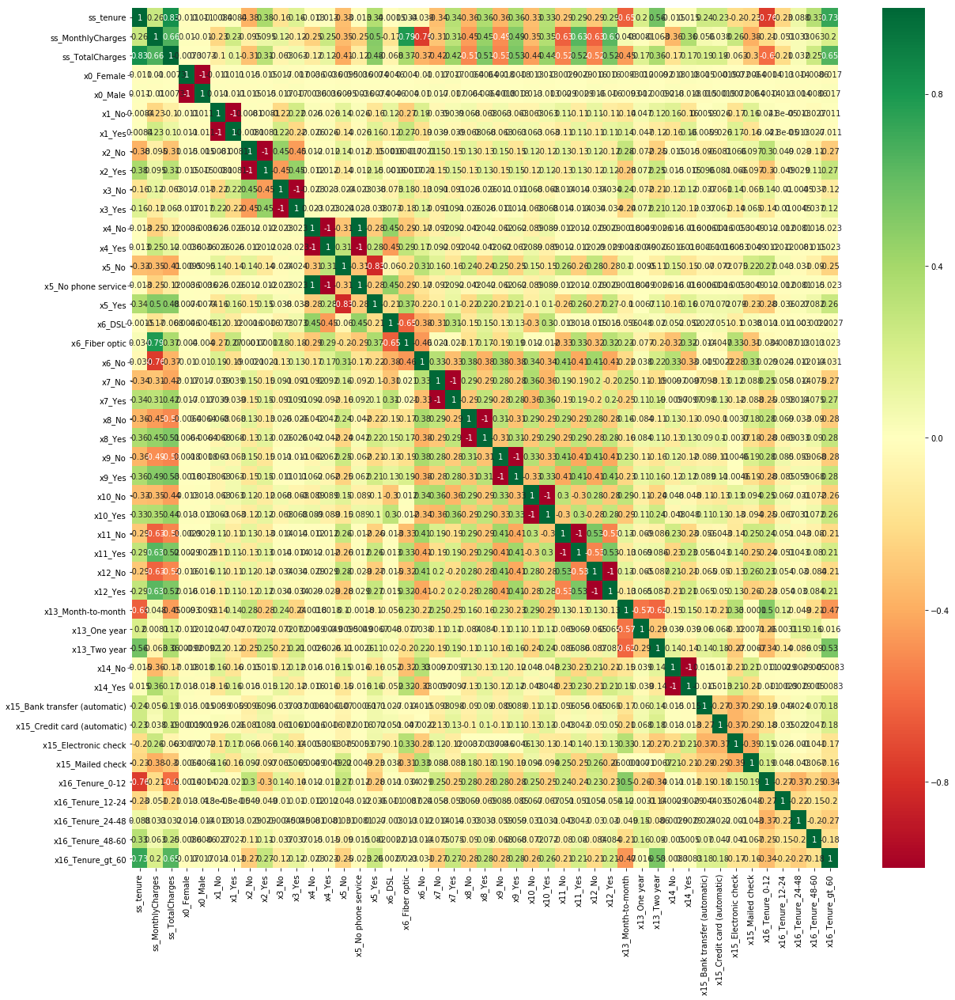

In [43]:
corr(Xtrain)

New corr matrix for all variables

In [39]:
#correlation
correlation = Xtrain.corr()
#tick labels
matrix_cols = correlation.columns.tolist()
#convert to array
corr_array  = np.array(correlation)

#Plotting
trace = go.Heatmap(z = corr_array,
                   x = matrix_cols,
                   y = matrix_cols,
                   colorscale = "Viridis",
                   colorbar   = dict(title = "Pearson Correlation coefficient",
                                     titleside = "right"
                                    ) ,
                  )

layout = go.Layout(dict(title = "Correlation Matrix for variables",
                        autosize = False,
                        height  = 720,
                        width   = 800,
                        margin  = dict(r = 0 ,l = 210,
                                       t = 25,b = 210,
                                      ),
                        yaxis   = dict(tickfont = dict(size = 9)),
                        xaxis   = dict(tickfont = dict(size = 9))
                       )
                  )

data = [trace]
fig = go.Figure(data=data,layout=layout)
py.iplot(fig)

In [44]:
Xtrain

,ss_tenure,ss_MonthlyCharges,ss_TotalCharges,x0_Female,x0_Male,x1_No,x1_Yes,x2_No,x2_Yes,x3_No,...,x14_Yes,x15_Bank transfer (automatic),x15_Credit card (automatic),x15_Electronic check,x15_Mailed check,x16_Tenure_0-12,x16_Tenure_12-24,x16_Tenure_24-48,x16_Tenure_48-60,x16_Tenure_gt_60
1579,1.330585,-0.383857,0.534804,1,0,0,1,1,0,1,...,1,1,0,0,0,0,0,0,0,1
1040,-0.013956,0.155250,0.022199,0,1,1,0,0,1,0,...,1,1,0,0,0,0,0,1,0,0
1074,0.352737,1.639866,0.977112,1,0,1,0,1,0,1,...,1,1,0,0,0,0,0,1,0,0
2473,-1.154780,-0.680780,-0.909757,0,1,1,0,1,0,1,...,0,0,0,0,1,1,0,0,0,0
6897,-0.951061,-0.322482,-0.809427,0,1,1,0,1,0,0,...,0,0,0,1,0,1,0,0,0,0
3880,-0.869574,0.327764,-0.649183,0,1,1,0,1,0,1,...,0,0,0,1,0,1,0,0,0,0
3001,-0.747343,0.327764,-0.552248,0,1,0,1,1,0,1,...,1,0,0,1,0,0,1,0,0,0
4685,0.800917,-1.309461,-0.421796,0,1,1,0,1,0,0,...,0,0,1,0,0,0,0,0,1,0
6887,-0.421393,1.160476,-0.090684,0,1,1,0,0,1,0,...,1,0,0,0,1,0,1,0,0,0
1456,-0.421393,1.022797,-0.027288,0,1,1,0,0,1,1,...,0,0,1,0,0,0,1,0,0,0


Fit the model 

In [51]:
# Feature extraction
test = SelectKBest(score_func=chi2, k=4)
fit = test.fit(Xtrain, ytrain)

# Summarize scores
np.set_printoptions(precision=3)
print(fit.scores_)

features = fit.transform(Xtrain)
# Summarize selected features
print(features[0:5,:])

[1.137e+04 2.444e+03 4.373e+05 8.091e-02 7.916e-02 1.973e+01 9.912e+01
 5.191e+01 5.585e+01 3.764e+01 8.780e+01 2.176e-01 2.297e-02 4.617e+00
 2.176e-01 6.186e+00 4.389e+01 2.451e+02 1.998e+02 4.135e+01 1.026e+02
 1.137e+01 2.102e+01 7.576e+00 1.412e+01 3.973e+01 9.411e+01 7.522e+00
 1.184e+01 8.539e+00 1.369e+01 3.655e+02 1.215e+02 3.465e+02 9.412e+01
 6.442e+01 5.017e+01 6.107e+01 2.929e+02 3.965e+01 3.295e+02 2.387e+00
 1.919e+01 4.751e+01 1.985e+02]
[[6.500e+01 5.350e+01 3.518e+03 0.000e+00]
 [3.200e+01 6.975e+01 2.348e+03 1.000e+00]
 [4.100e+01 1.145e+02 4.527e+03 1.000e+00]
 [4.000e+00 4.455e+01 2.208e+02 1.000e+00]
 [9.000e+00 5.535e+01 4.498e+02 1.000e+00]]


In [52]:
# Import your necessary dependencies
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression

Select top 5 features

In [66]:
# Feature extraction
model = LogisticRegression()
rfe = RFE(model, 5)
fit = rfe.fit(Xtrain, ytrain)
print("Num Features: %s" % (fit.n_features_))
print("Selected Features: %s" % (fit.support_))
print("Feature Ranking: %s" % (fit.ranking_))

L=(fit.support_)
#colname = df.columns[pos]
c=0;
selected_col_5 = []

for i in L:
    
    if i==True:
        selected_col_5.append(Xtrain.columns[c])
    c=c+1;
selected_col_5

Num Features: 5
Selected Features: [False False False False False False False False False False False False
 False False False False False  True  True False False False False False
 False False False False False False False  True False  True False False
 False False False False  True False False False False]
Feature Ranking: [28 40 41 35 36 13 18 38 34 37 21 22 14  5 16 25  9  1  1 27  2 30 15 39
 33 23 11 10 24  3 26  1 29  1 12 20 31 32  7 19  1 17  8  6  4]


['x6_Fiber optic',
 'x6_No',
 'x13_Month-to-month',
 'x13_Two year',
 'x16_Tenure_0-12']

Select top 10

In [67]:
# Feature extraction
model = LogisticRegression()
rfe = RFE(model, 5)
fit = rfe.fit(Xtrain, ytrain)
print("Num Features: %s" % (fit.n_features_))
print("Selected Features: %s" % (fit.support_))
print("Feature Ranking: %s" % (fit.ranking_))

L=(fit.support_)
#colname = df.columns[pos]
c=0;
selected_col_5 = []

for i in L:
    
    if i==True:
        selected_col_5.append(Xtrain.columns[c])
    c=c+1;
selected_col_5

Num Features: 10
Selected Features: [False False False False False False False False False False False False
 False  True False False False  True  True False  True False False False
 False False False False False  True False  True False  True False False
 False False False False  True False False  True  True]
Feature Ranking: [23 35 36 30 31  8 13 33 29 32 16 17  9  1 11 20  4  1  1 22  1 25 10 34
 28 18  6  5 19  1 21  1 24  1  7 15 26 27  2 14  1 12  3  1  1]


['x5_No',
 'x6_Fiber optic',
 'x6_No',
 'x7_Yes',
 'x12_No',
 'x13_Month-to-month',
 'x13_Two year',
 'x16_Tenure_0-12',
 'x16_Tenure_48-60',
 'x16_Tenure_gt_60']

In [159]:
selected_col_5

['x6_Fiber optic',
 'x6_No',
 'x13_Month-to-month',
 'x13_Two year',
 'x16_Tenure_0-12']

# top 5 features

In [36]:
from sklearn.linear_model import LogisticRegression 

# Logistic

In [78]:
fitted_model=LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
          penalty='l2', random_state=None, solver='liblinear', tol=0.0001,
          verbose=0, warm_start=False)

In [79]:
fitted_model.fit(Xtrain[selected_col_5], ytrain)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
          penalty='l2', random_state=None, solver='liblinear', tol=0.0001,
          verbose=0, warm_start=False)

In [80]:
fitted_model.score(Xtrain[selected_col_5], ytrain)

0.7840308817553839

In [81]:
predicted=fitted_model.predict(Xtest[selected_col_5])
from sklearn import metrics
print(metrics.accuracy_score(ytest, predicted))
print( metrics.classification_report(ytest, predicted) )

0.7933649289099526
              precision    recall  f1-score   support

          No       0.80      0.95      0.87      1555
         Yes       0.72      0.35      0.47       555

   micro avg       0.79      0.79      0.79      2110
   macro avg       0.76      0.65      0.67      2110
weighted avg       0.78      0.79      0.77      2110



In [82]:
p,r,f,s = metrics.precision_recall_fscore_support(ytest, predicted)
print("\t:")
print("\nAccuracy: = %.2f%%" % (metrics.accuracy_score(ytest, predicted)*100))
print("Precision: = %.2f%%" % (p[0]*100))
print("Recall: = %.2f%%" % (r[0]*100))
print("Confusion matrix: ")
cnf_matrix=metrics.confusion_matrix(ytest, predicted)

	:

Accuracy: = 79.34%
Precision: = 80.49%
Recall: = 94.98%
Confusion matrix: 


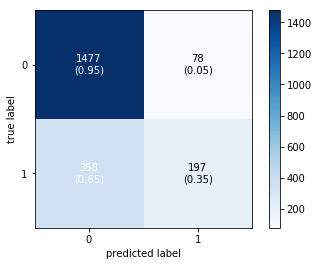

In [83]:
from mlxtend.plotting import plot_confusion_matrix

fig, ax = plot_confusion_matrix(conf_mat=cnf_matrix,show_absolute=True,
                                show_normed=True,
                                colorbar=True)

plt.show()

In [119]:
from sklearn.ensemble import RandomForestClassifier                                                                                     
rfc = RandomForestClassifier(n_estimators=10, 
                             max_features='auto', bootstrap=True,
                             max_depth=None, min_samples_split=2, min_samples_leaf=1, class_weight=None)   
rfc.fit(Xtrain[selected_col_5], ytrain)
y_pred = rfc.predict(Xtest[selected_col_5])
print (rfc.score(Xtest[selected_col_5], ytest))

0.7933649289099526


In [121]:
estimator = rfc.estimators_[5]


In [86]:
p,r,f,s = metrics.precision_recall_fscore_support(ytest, y_pred)
print("\t:")
print("\nAccuracy: = %.2f%%" % (metrics.accuracy_score(ytest, y_pred)*100))
print("Precision: = %.2f%%" % (p[0]*100))
print("Recall: = %.2f%%" % (r[0]*100))
print("Confusion matrix: ")
cnf_matrix=metrics.confusion_matrix(ytest, y_pred)

	:

Accuracy: = 79.34%
Precision: = 80.49%
Recall: = 94.98%
Confusion matrix: 


In [140]:
from sklearn.tree import export_graphviz
# Export as dot file
export_graphviz(estimator, out_file='tree.dot', 
                feature_names = selected_col_5,
                #class_names = ytest,
                rounded = True, proportion = False, 
                precision = 2, filled = True)
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree_5.png', '-Gdpi=600'])

#Display in jupyter notebook
from IPython.display import Image
Image(filename = 'tree_5.png')

# Gradient

In [88]:
from sklearn.ensemble import GradientBoostingClassifier 
gbc = GradientBoostingClassifier(n_estimators=100, learning_rate=0.01,
                                                   max_depth=3, min_samples_split=2, min_samples_leaf=1)
gbc.fit(Xtrain[selected_col_5], ytrain) 
y_pred = gbc.predict(Xtest[selected_col_5])  
print (gbc.score(Xtest[selected_col_5], ytest))  

0.7933649289099526


In [89]:
p,r,f,s = metrics.precision_recall_fscore_support(ytest, y_pred)
print("\t:")
print("\nAccuracy: = %.2f%%" % (metrics.accuracy_score(ytest, y_pred)*100))
print("Precision: = %.2f%%" % (p[0]*100))
print("Recall: = %.2f%%" % (r[0]*100))
print("Confusion matrix: ")
cnf_matrix=metrics.confusion_matrix(ytest, y_pred)

	:

Accuracy: = 79.34%
Precision: = 80.49%
Recall: = 94.98%
Confusion matrix: 


# Ensemple

In [90]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.ensemble import VotingClassifier   
dtc = DecisionTreeClassifier(max_depth=4)
knn = KNeighborsClassifier(n_neighbors=7)
svc = SVC(gamma='scale', kernel='rbf', probability=True)
#eclf = VotingClassifier(estimators=[('dtc', dtc), ('knn', knn), ('svc', svc)], voting='hard')  
eclf = VotingClassifier(estimators=[('dtc', dtc), ('knn', knn), ('svc', svc)], voting='soft', weights=[2, 1, 2])       
eclf.fit(Xtrain[selected_col_5], ytrain)
y_pred = eclf.predict(Xtest[selected_col_5])
print (eclf.score(Xtest[selected_col_5], ytest))

0.7933649289099526


In [91]:
p,r,f,s = metrics.precision_recall_fscore_support(ytest, y_pred)
print("\t:")
print("\nAccuracy: = %.2f%%" % (metrics.accuracy_score(ytest, y_pred)*100))
print("Precision: = %.2f%%" % (p[0]*100))
print("Recall: = %.2f%%" % (r[0]*100))
print("Confusion matrix: ")
cnf_matrix=metrics.confusion_matrix(ytest, y_pred)

	:

Accuracy: = 79.34%
Precision: = 80.49%
Recall: = 94.98%
Confusion matrix: 


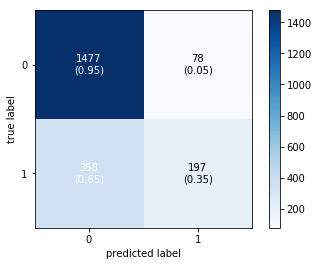

In [92]:
from mlxtend.plotting import plot_confusion_matrix

fig, ax = plot_confusion_matrix(conf_mat=cnf_matrix,show_absolute=True,
                                show_normed=True,
                                colorbar=True)

plt.show()

# Top 10

In [93]:
fitted_model.fit(Xtrain[selected_col_10], ytrain)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
          penalty='l2', random_state=None, solver='liblinear', tol=0.0001,
          verbose=0, warm_start=False)

In [94]:
fitted_model.score(Xtrain[selected_col_10], ytrain)

0.7923608289313288

In [95]:
predicted=fitted_model.predict(Xtest[selected_col_10])
from sklearn import metrics
print(metrics.accuracy_score(ytest, predicted))
print( metrics.classification_report(ytest, predicted) )

0.7909952606635071
              precision    recall  f1-score   support

          No       0.83      0.91      0.86      1555
         Yes       0.64      0.47      0.54       555

   micro avg       0.79      0.79      0.79      2110
   macro avg       0.73      0.69      0.70      2110
weighted avg       0.78      0.79      0.78      2110



In [97]:
p,r,f,s = metrics.precision_recall_fscore_support(ytest, predicted)
print("\t:")
print("\nAccuracy: = %.2f%%" % (metrics.accuracy_score(ytest, predicted)*100))
print("Precision: = %.2f%%" % (p[0]*100))
print("Recall: = %.2f%%" % (r[0]*100))
print("Confusion matrix: ")
cnf_matrix=metrics.confusion_matrix(ytest, predicted)

	:

Accuracy: = 79.10%
Precision: = 82.69%
Recall: = 90.61%
Confusion matrix: 


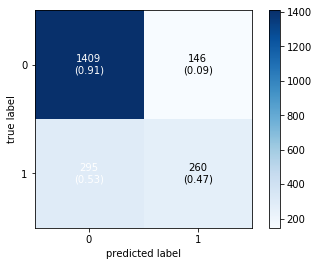

In [98]:
from mlxtend.plotting import plot_confusion_matrix

fig, ax = plot_confusion_matrix(conf_mat=cnf_matrix,show_absolute=True,
                                show_normed=True,
                                colorbar=True)

plt.show()

In [141]:
from sklearn.ensemble import RandomForestClassifier                                                                                     
rfc = RandomForestClassifier(n_estimators=10, 
                             max_features='auto', bootstrap=True,
                             max_depth=None, min_samples_split=2, min_samples_leaf=1, class_weight=None)   
rfc.fit(Xtrain[selected_col_10], ytrain)
y_pred = rfc.predict(Xtest[selected_col_10])
print (rfc.score(Xtest[selected_col_10], ytest))
p,r,f,s = metrics.precision_recall_fscore_support(ytest, y_pred)
print("\t:")
print("\nAccuracy: = %.2f%%" % (metrics.accuracy_score(ytest, y_pred)*100))
print("Precision: = %.2f%%" % (p[0]*100))
print("Recall: = %.2f%%" % (r[0]*100))
print("Confusion matrix: ")
cnf_matrix=metrics.confusion_matrix(ytest, y_pred)

0.7815165876777251
	:

Accuracy: = 78.15%
Precision: = 82.21%
Recall: = 89.77%
Confusion matrix: 


In [148]:
rfc.estimators_[9]

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False,
            random_state=1530550861, splitter='best')

In [158]:
estimator = rfc.estimators_[5]

from sklearn.tree import export_graphviz
# Export as dot file
export_graphviz(estimator, out_file='tree_10.dot', 
                feature_names = selected_col_10,
                #class_names = ytest,
                rounded = True, proportion = False, 
                precision = 2
                , filled = True)
from subprocess import call
call(['dot', '-Tpng', 'tree.dot_10', '-o', 'tree_10.png', '-Gdpi=600'])

#Display in jupyter notebook
from IPython.display import Image
Image(filename = 'tree_10.png')

In [113]:
from sklearn.ensemble import GradientBoostingClassifier 
gbc = GradientBoostingClassifier(n_estimators=100, learning_rate=0.01,
                                                   max_depth=3, min_samples_split=2, min_samples_leaf=1)
gbc.fit(Xtrain[selected_col_10], ytrain) 
y_pred = gbc.predict(Xtest[selected_col_10])  
print (gbc.score(Xtest[selected_col_10], ytest))  
p,r,f,s = metrics.precision_recall_fscore_support(ytest, y_pred)
print("\t:")
print("\nAccuracy: = %.2f%%" % (metrics.accuracy_score(ytest, y_pred)*100))
print("Precision: = %.2f%%" % (p[0]*100))
print("Recall: = %.2f%%" % (r[0]*100))
print("Confusion matrix: ")
cnf_matrix=metrics.confusion_matrix(ytest, y_pred)

0.7928909952606635
	:

Accuracy: = 79.29%
Precision: = 80.35%
Recall: = 95.18%
Confusion matrix: 


In [114]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.ensemble import VotingClassifier   
dtc = DecisionTreeClassifier(max_depth=4)
knn = KNeighborsClassifier(n_neighbors=7)
svc = SVC(gamma='scale', kernel='rbf', probability=True)
#eclf = VotingClassifier(estimators=[('dtc', dtc), ('knn', knn), ('svc', svc)], voting='hard')  
eclf = VotingClassifier(estimators=[('dtc', dtc), ('knn', knn), ('svc', svc)], voting='soft', weights=[2, 1, 2])       
eclf.fit(Xtrain[selected_col_10], ytrain)
y_pred = eclf.predict(Xtest[selected_col_10])
print (eclf.score(Xtest[selected_col_10], ytest))
p,r,f,s = metrics.precision_recall_fscore_support(ytest, y_pred)
print("\t:")
print("\nAccuracy: = %.2f%%" % (metrics.accuracy_score(ytest, y_pred)*100))
print("Precision: = %.2f%%" % (p[0]*100))
print("Recall: = %.2f%%" % (r[0]*100))
print("Confusion matrix: ")
cnf_matrix=metrics.confusion_matrix(ytest, y_pred)

0.7895734597156399
	:

Accuracy: = 78.96%
Precision: = 81.80%
Recall: = 91.90%
Confusion matrix: 


# All

In [99]:
fitted_model.fit(Xtrain, ytrain)
fitted_model.score(Xtrain, ytrain)

0.8088175538399025

0.8
              precision    recall  f1-score   support

          No       0.84      0.90      0.87      1555
         Yes       0.65      0.53      0.58       555

   micro avg       0.80      0.80      0.80      2110
   macro avg       0.74      0.71      0.72      2110
weighted avg       0.79      0.80      0.79      2110

	:

Accuracy: = 80.00%
Precision: = 84.15%
Recall: = 89.77%
Confusion matrix: 


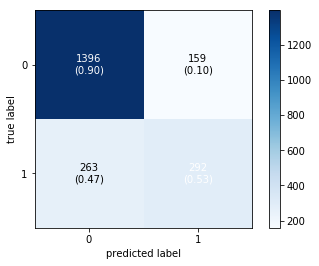

In [100]:
predicted=fitted_model.predict(Xtest)
from sklearn import metrics
print(metrics.accuracy_score(ytest, predicted))
print( metrics.classification_report(ytest, predicted) )
p,r,f,s = metrics.precision_recall_fscore_support(ytest, predicted)
print("\t:")
print("\nAccuracy: = %.2f%%" % (metrics.accuracy_score(ytest, predicted)*100))
print("Precision: = %.2f%%" % (p[0]*100))
print("Recall: = %.2f%%" % (r[0]*100))
print("Confusion matrix: ")
cnf_matrix=metrics.confusion_matrix(ytest, predicted)
from mlxtend.plotting import plot_confusion_matrix

fig, ax = plot_confusion_matrix(conf_mat=cnf_matrix,show_absolute=True,
                                show_normed=True,
                                colorbar=True)

plt.show()

In [116]:
from sklearn.ensemble import RandomForestClassifier                                                                                     
rfc = RandomForestClassifier(n_estimators=10, 
                             max_features='auto', bootstrap=True,
                             max_depth=None, min_samples_split=2, min_samples_leaf=1, class_weight=None)   
rfc.fit(Xtrain, ytrain)
y_pred = rfc.predict(Xtest)
print (rfc.score(Xtest, ytest))
p,r,f,s = metrics.precision_recall_fscore_support(ytest, y_pred)
print("\t:")
print("\nAccuracy: = %.2f%%" % (metrics.accuracy_score(ytest, y_pred)*100))
print("Precision: = %.2f%%" % (p[0]*100))
print("Recall: = %.2f%%" % (r[0]*100))
print("Confusion matrix: ")
cnf_matrix=metrics.confusion_matrix(ytest, y_pred)

0.7781990521327015
	:

Accuracy: = 77.82%
Precision: = 81.54%
Recall: = 90.35%
Confusion matrix: 


In [117]:
from sklearn.ensemble import GradientBoostingClassifier 
gbc = GradientBoostingClassifier(n_estimators=100, learning_rate=0.01,
                                                   max_depth=3, min_samples_split=2, min_samples_leaf=1)
gbc.fit(Xtrain, ytrain) 
y_pred = gbc.predict(Xtest)  
print (gbc.score(Xtest, ytest))  
p,r,f,s = metrics.precision_recall_fscore_support(ytest, y_pred)
print("\t:")
print("\nAccuracy: = %.2f%%" % (metrics.accuracy_score(ytest, y_pred)*100))
print("Precision: = %.2f%%" % (p[0]*100))
print("Recall: = %.2f%%" % (r[0]*100))
print("Confusion matrix: ")
cnf_matrix=metrics.confusion_matrix(ytest, y_pred)

0.7800947867298578
	:

Accuracy: = 78.01%
Precision: = 78.10%
Recall: = 97.49%
Confusion matrix: 


In [118]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.ensemble import VotingClassifier   
dtc = DecisionTreeClassifier(max_depth=4)
knn = KNeighborsClassifier(n_neighbors=7)
svc = SVC(gamma='scale', kernel='rbf', probability=True)
#eclf = VotingClassifier(estimators=[('dtc', dtc), ('knn', knn), ('svc', svc)], voting='hard')  
eclf = VotingClassifier(estimators=[('dtc', dtc), ('knn', knn), ('svc', svc)], voting='soft', weights=[2, 1, 2])       
eclf.fit(Xtrain, ytrain)
y_pred = eclf.predict(Xtest)
print (eclf.score(Xtest, ytest))
p,r,f,s = metrics.precision_recall_fscore_support(ytest, y_pred)
print("\t:")
print("\nAccuracy: = %.2f%%" % (metrics.accuracy_score(ytest, y_pred)*100))
print("Precision: = %.2f%%" % (p[0]*100))
print("Recall: = %.2f%%" % (r[0]*100))
print("Confusion matrix: ")
cnf_matrix=metrics.confusion_matrix(ytest, y_pred)

0.785781990521327
	:

Accuracy: = 78.58%
Precision: = 81.25%
Recall: = 92.22%
Confusion matrix: 


<h4>Standard Scale all of the numeric features in Xtest, include transformed numeric features in Xtest, and drop original numeric features in Xtest</h4>

In [40]:
Xtestss = pd.DataFrame(ss.transform(Xtest[num_cols]), columns=['ss_'+x for x in num_cols], index=Xtest.index)
Xtest = pd.concat([Xtest, Xtestss], axis=1)
Xtest.drop(num_cols,axis=1,inplace=True)
Xtest.drop(["customerID"],axis=1,inplace=True)
Xtest.head()

,gender,SeniorCitizen,Partner,Dependents,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,tenure_group,ss_tenure,ss_MonthlyCharges,ss_TotalCharges
1773,Male,No,Yes,Yes,Yes,Yes,No,No,No,No,No,No,No,Two year,No,Credit card (automatic),Tenure_gt_60,1.615791,-1.337661,-0.191956
5028,Female,Yes,Yes,No,Yes,Yes,Fiber optic,No,No,No,No,No,Yes,Month-to-month,Yes,Credit card (automatic),Tenure_12-24,-0.665855,0.672792,-0.403987
1102,Female,No,No,No,Yes,Yes,Fiber optic,No,Yes,No,No,Yes,Yes,Two year,No,Bank transfer (automatic),Tenure_gt_60,1.249098,1.074219,1.733117
1660,Female,No,No,No,Yes,Yes,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,Tenure_0-12,-0.951061,0.390798,-0.715756
925,Female,No,No,No,Yes,No,Fiber optic,No,Yes,Yes,No,No,No,Month-to-month,Yes,Electronic check,Tenure_12-24,-0.788087,0.533454,-0.589247


In [76]:
XcatTest = pd.DataFrame(ohe.transform(Xtest[cat_cols]), columns=ohe.get_feature_names(), index=Xtest.index)
Xtest = pd.concat([Xtest, XcatTest], axis=1)
Xtest.drop(cat_cols,axis=1,inplace=True)
Xtest.head()

,customerID,tenure,MonthlyCharges,TotalCharges,x0_Female,x0_Male,x1_No,x1_Yes,x2_No,x2_Yes,...,x14_Yes,x15_Bank transfer (automatic),x15_Credit card (automatic),x15_Electronic check,x15_Mailed check,x16_Tenure_0-12,x16_Tenure_12-24,x16_Tenure_24-48,x16_Tenure_48-60,x16_Tenure_gt_60
1773,6181-AXXYF,72,24.75,1859.10,0,1,1,0,0,1,...,0,0,1,0,0,0,0,0,0,1
5028,1268-ASBGA,16,85.35,1375.15,1,0,0,1,0,1,...,1,0,1,0,0,0,1,0,0,0
1102,4159-NAAIX,63,97.45,6253.00,1,0,1,0,1,0,...,0,1,0,0,0,0,0,0,0,1
1660,1219-NNDDO,9,76.85,663.55,1,0,1,0,1,0,...,1,0,0,1,0,1,0,0,0,0
925,9625-QSTYE,13,81.15,952.30,1,0,1,0,1,0,...,1,0,0,1,0,0,1,0,0,0


In [77]:
Xtest.drop("customerID",axis=1,inplace=True)


In [42]:
predicted=fitted_model.predict(Xtest)
from sklearn import metrics
print(metrics.accuracy_score(ytest, predicted))
print( metrics.classification_report(ytest, predicted) )

0.7990521327014218
              precision    recall  f1-score   support

          No       0.84      0.90      0.87      1555
         Yes       0.64      0.53      0.58       555

   micro avg       0.80      0.80      0.80      2110
   macro avg       0.74      0.71      0.72      2110
weighted avg       0.79      0.80      0.79      2110



In [43]:
p,r,f,s = metrics.precision_recall_fscore_support(ytest, predicted)
print("\t:")
print("\nAccuracy: = %.2f%%" % (metrics.accuracy_score(ytest, predicted)*100))
print("Precision: = %.2f%%" % (p[0]*100))
print("Recall: = %.2f%%" % (r[0]*100))
print("Confusion matrix: ")
cnf_matrix=metrics.confusion_matrix(ytest, predicted)

	:

Accuracy: = 79.91%
Precision: = 84.13%
Recall: = 89.65%
Confusion matrix: 


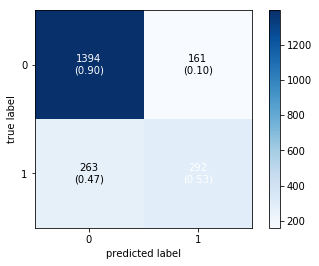

In [44]:
from mlxtend.plotting import plot_confusion_matrix

fig, ax = plot_confusion_matrix(conf_mat=cnf_matrix,show_absolute=True,
                                show_normed=True,
                                colorbar=True)

plt.show()

# Feature Importance

In [45]:
coefficients  = pd.DataFrame(fitted_model.coef_.ravel())

In [46]:
cols    = [i for i in telcom.columns if i not in Id_col + target_col]
column_df     = pd.DataFrame(cols)
coef_sumry    = (pd.merge(coefficients,column_df,left_index= True,
                              right_index= True, how = "left"))
coef_sumry.columns = ["coefficients","features"]
coef_sumry    = coef_sumry.sort_values(by = "coefficients",ascending = False)
    

In [47]:
#plot coeffs
    
trace4 = go.Bar(x = coef_sumry["features"],y = coef_sumry["coefficients"],
                    name = "coefficients",
                    marker = dict(color = coef_sumry["coefficients"],
                                  colorscale = "Picnic",
                                  line = dict(width = .6,color = "black")))

In [48]:
data1   = [trace4]

In [49]:
layout = go.Layout(dict(title = "Feature Importance",
                        plot_bgcolor  = "rgb(243,243,243)",
                        paper_bgcolor = "rgb(243,243,243)",
                        xaxis = dict(gridcolor = 'rgb(255, 255, 255)',
                                     title = "Feature name",
                                     zerolinewidth=1,ticklen=5,gridwidth=2),
                        yaxis = dict(gridcolor = 'rgb(255, 255, 255)',
                                    
                                     zerolinewidth=1,ticklen=5,gridwidth=2),
                       )
                  )
data = [trace4]
fig  = go.Figure(data=data,layout=layout)
py.iplot(fig)